In [155]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA


#from google.colab import drive
#drive.mount('/content/drive/')

!!!Library requrements - sklearn, PCA and procedure for the installation

Download the data from the Keograms folder (additional data)

In [156]:
data_date_1 = np.load('Keograms/data_date.npy')
year_arr_1 = np.load('Keograms/year_arr.npy')
dataset_old_1 = np.load('Keograms/dataset_old.npy')
dataset_old_lat_1 = np.load('Keograms/dataset_old_lat.npy')
non_zero_indices = np.load('Keograms/indices_zero.npy')
non_zero_indices_lat = np.load('Keograms/indices_zero_lat.npy')

print(data_date_1.shape)
print(year_arr_1.shape)
print(dataset_old_1.shape)
print(dataset_old_lat_1.shape)

(925,)
(925,)
(925, 224, 224, 3)
(925, 224, 224, 3)


Download the data from the Keograms folder (main data)

In [157]:
my_list = np.load('Keograms/my_list_new.npy')
my_list_lat = np.load('Keograms/my_list_lat_new.npy')
data_date = np.load('Keograms/new_dates.npy')
year_arr = np.load('Keograms/new_years.npy', allow_pickle=True)
dataset_old = np.load('Keograms/dataset_old_2.npy')
dataset_old_lat = np.load('Keograms/dataset_old_lat_2.npy')

Extraction main contours areas from longitudinal keogram

In [158]:
from PIL import Image
import cv2
from scipy.spatial.distance import cdist

Num = 3  #3
Limit = 600 #

dataset_average = []
dataset_std_x = []
dataset_std_y = []
dataset_num = []
dataset_counturs = []
for arr in dataset_old:

  image_pil = Image.fromarray(arr)

  grays = image_pil.convert('L')
  grays = np.asarray(grays)
  grays = cv2.bitwise_not(grays)
  print('size', grays.shape)

  contours, _ = cv2.findContours(grays, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > Limit]

  contour_areas = [cv2.contourArea(cnt) for cnt in filtered_contours]


  contour_areas_sorted = sorted(contour_areas, reverse=True)

  # 6. General result
  top_4_areas = contour_areas_sorted[:Num] + [0] * (Num - len(contour_areas_sorted))

  dataset_counturs.append(top_4_areas)
  num_contours = len(filtered_contours)
  print(f'Number of contours: {num_contours}')

dataset_counturs = np.asarray(dataset_counturs)

print(dataset_counturs.shape)



size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 2
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 3
size (224, 224)
Number of contours: 3
size (224, 224)
Number of contours: 4
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 3
size (224, 224)
Number of contours: 1
size (224, 2

Number of contours: 1
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 3
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 2
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 3
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 3
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 2
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 0
size (224, 224)
Number of contours: 2
size (224, 224)
Number of contours: 1
size (224, 224)
Number of contours: 1
size (224, 224)
Number of co

Extraction - latitudinal keogram

In [159]:
dataset_lat_average = []
dataset_lat_std_x = []
dataset_lat_std_y = []
dataset_lat_num = []
dataset_counturs_lat = []
Limit = 600  #600
Num = 3     #3
for arr in dataset_old_lat:

  image_pil = Image.fromarray(arr)


  grays = image_pil.convert('L')
  grays = np.asarray(grays)
  grays = cv2.bitwise_not(grays)



  contours, _ = cv2.findContours(grays, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > Limit]

  contour_areas = [cv2.contourArea(cnt) for cnt in filtered_contours]


  contour_areas_sorted = sorted(contour_areas, reverse=True)

  # 6. General result
  top_4_areas = contour_areas_sorted[:Num] + [0] * (Num - len(contour_areas_sorted))

  dataset_counturs_lat.append(top_4_areas)
  num_contours = len(filtered_contours)
  print(f'Number of contours: {num_contours}')

dataset_counturs_lat = np.asarray(dataset_counturs_lat)

Number of contours: 0
Number of contours: 0
Number of contours: 0
Number of contours: 1
Number of contours: 0
Number of contours: 0
Number of contours: 0
Number of contours: 0
Number of contours: 1
Number of contours: 2
Number of contours: 1
Number of contours: 0
Number of contours: 1
Number of contours: 0
Number of contours: 0
Number of contours: 0
Number of contours: 4
Number of contours: 1
Number of contours: 2
Number of contours: 0
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 0
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 2
Number of contours: 2
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 0
Number of contours: 1
Number of contours: 1
Number of contours: 0
Number of contours: 2
Number of contours: 0
Number of 

Number of contours: 2
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 0
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 0
Number of contours: 1
Number of contours: 2
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 2
Number of contours: 1
Number of contours: 2
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 3
Number of contours: 0
Number of contours: 1
Number of contours: 0
Number of contours: 0
Number of contours: 1
Number of contours: 0
Number of contours: 1
Number of contours: 0


In [160]:
print(dataset_counturs.shape)
print(dataset_counturs_lat.shape)

(425, 3)
(425, 3)


In [161]:
dataset_total_counturs = np.concatenate((dataset_counturs, dataset_counturs_lat), axis = 1)
print(dataset_total_counturs.shape)

(425, 6)


Clustering algorithm

In [162]:
from sklearn.mixture import GaussianMixture

from scipy.spatial.distance import cdist

from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import silhouette_score, davies_bouldin_score

from scipy.stats import skew




scaler = MinMaxScaler()
#scaler = StandardScaler()

#square_array = [64, 128, 256, 512]
square_array = [512]



avr_matrix_gen = dataset_total_counturs.copy()
#avr_matrix_gen = avr_matrix_gen/np.max(avr_matrix_gen)

avr_matrix_gen = scaler.fit_transform(avr_matrix_gen)



accuracy_kmeans_ecti = []
accuracy_bdv_kmeans_ecti = []


accuracy_gmm_ecti = []
accuracy_bdv_gmm_ecti = []


for n_cluster in [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]:

  y_t = avr_matrix_gen.copy()
  kmeans = KMeans(n_cluster, max_iter=10000, n_init=20, tol=1e-8, random_state = 42)
  gmm = GaussianMixture(n_components=n_cluster, covariance_type = 'tied', tol=1e-2,  n_init = 2, random_state = 42)

  # Training
  kmeans.fit(y_t)
  gmm.fit(y_t)

  # Prediction
  y_pred_kmeans_ecti = kmeans.predict(y_t)
  y_pred_gmm_ecti = gmm.predict(y_t)


  this_set = y_t.copy()
  silhouette_avg = silhouette_score(this_set, y_pred_kmeans_ecti)
  bouldin_avg = davies_bouldin_score(this_set, y_pred_kmeans_ecti)

  silhouette_avg_mm = silhouette_score(this_set, y_pred_gmm_ecti)
  bouldin_avg_mm = davies_bouldin_score(this_set, y_pred_gmm_ecti)

  accuracy_kmeans_ecti.append(silhouette_avg)
  accuracy_bdv_kmeans_ecti.append(bouldin_avg)

  accuracy_gmm_ecti.append(silhouette_avg_mm)
  accuracy_bdv_gmm_ecti.append(bouldin_avg_mm)



print(accuracy_kmeans_ecti)
print(accuracy_bdv_kmeans_ecti)

print(accuracy_gmm_ecti)
print(accuracy_bdv_gmm_ecti)

[0.5749698627829367, 0.5275081976041498, 0.5156191393991872, 0.5398918045652744, 0.5065194206651976, 0.5223334164764405, 0.4932479234709635, 0.49925526015606425, 0.5003741222046103, 0.46921752053781274, 0.4814812025109795]
[0.6551493976082285, 0.939996507589469, 1.022555228148396, 0.9918747313334514, 0.9660889310240716, 0.8067600895598043, 0.8461850686769837, 0.8691098755069381, 0.9077534198953998, 0.9080919023852811, 0.9229982540493014]
[0.571544911261502, 0.5077950817057847, 0.46904590915111377, 0.4878632287593169, 0.49740710510601593, 0.5158388383782259, 0.47253769697408404, 0.42494133941518386, 0.453947019031426, 0.3820732573425295, 0.42879402304525394]
[0.6526636299514709, 0.968721117293233, 1.0440532905599864, 1.0261167781350222, 0.8970762446030439, 0.8069323269793701, 0.9118402804639014, 0.9550798842368755, 0.9477062568378468, 1.0024552432511316, 0.8802025622491921]


Silhouette and Davies-Bouldind plots

(2.0, 8.0, 0.45, 1.84)

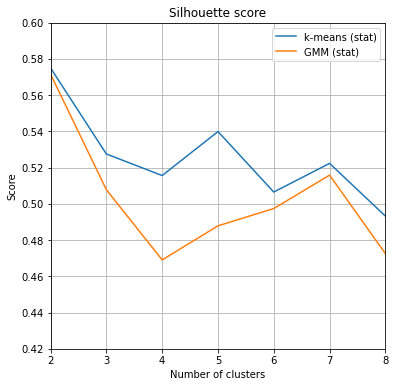

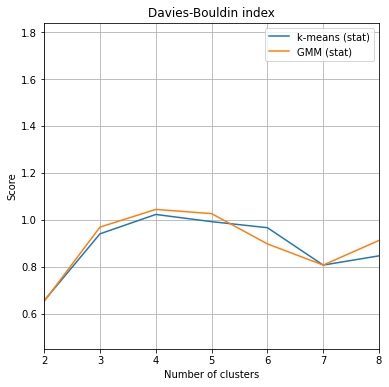

In [163]:
plt.figure(figsize = (6, 6))

x_axis = np.asarray([2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])



plt.plot(x_axis, accuracy_kmeans_ecti)
plt.plot(x_axis, accuracy_gmm_ecti)
  #plt.plot(x_axis, accuracy_dim)
#plt.plot(x_axis, accuracy_gmm_ecti, linestyle = '--')
plt.grid()
plt.title('Silhouette score')
plt.legend(['k-means (stat)', 'GMM (stat)'])
plt.ylabel('Score')
plt.xlabel('Number of clusters')
plt.axis([2, 8, 0.42, 0.6])

plt.figure(figsize = (6, 6))

x_axis = np.asarray([2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])



plt.plot(x_axis, accuracy_bdv_kmeans_ecti)
plt.plot(x_axis, accuracy_bdv_gmm_ecti)
  #plt.plot(x_axis, accuracy_dim)
#plt.plot(x_axis, accuracy_gmm_ecti, linestyle = '--')
plt.grid()
plt.title('Davies-Bouldin index')
plt.legend(['k-means (stat)', 'GMM (stat)'])
plt.ylabel('Score')
plt.xlabel('Number of clusters')
plt.axis([2, 8, 0.45, 1.84])

Download other model's result

In [164]:
accuracy_kmeans_ecti_1 = np.load('Keograms/accuracy_kmeans_ecti_2.npy')
accuracy_gmm_ecti_1 = np.load('Keograms/accuracy_gmm_ecti_2.npy')

accuracy_bdv_kmeans_ecti_1 = np.load('Keograms/accuracy_bdv_kmeans_ecti_2.npy')
accuracy_bdv_gmm_ecti_1 = np.load('Keograms/accuracy_bdv_gmm_ecti_2.npy')


accuracy_kmeans_ecti_2 = np.load('Keograms/accuracy_kmeans_ecti.npy')
accuracy_gmm_ecti_2 = np.load('Keograms/accuracy_gmm_ecti.npy')

accuracy_bdv_kmeans_ecti_2 = np.load('Keograms/accuracy_bdv_kmeans_ecti.npy')
accuracy_bdv_gmm_ecti_2 = np.load('Keograms/accuracy_bdv_gmm_ecti.npy')

Silhouette score for different feature extractors

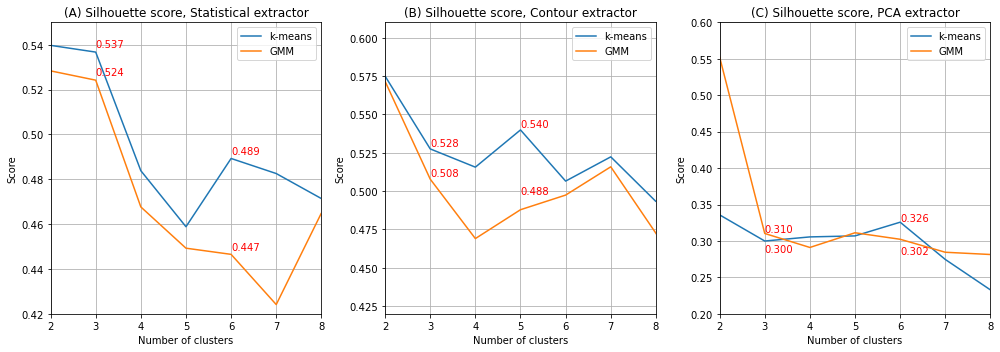

In [165]:
import matplotlib.pyplot as plt

# Create the figure
fig, axs = plt.subplots(1, 3, figsize=(14, 5))

# First plot
axs[0].plot(x_axis, accuracy_kmeans_ecti_1, label='k-means')
axs[0].plot(x_axis, accuracy_gmm_ecti_1, label='GMM')
axs[0].grid()
axs[0].set_title('(A) Silhouette score, Statistical extractor')
axs[0].set_ylabel('Score')
axs[0].set_xlabel('Number of clusters')
axs[0].legend()
axs[0].axis([2, 8, 0.42, 0.55])

# Second plot
axs[1].plot(x_axis, accuracy_kmeans_ecti, label='k-means')
axs[1].plot(x_axis, accuracy_gmm_ecti, label='GMM')
axs[1].grid()
axs[1].set_title('(B) Silhouette score, Contour extractor')
axs[1].set_ylabel('Score')
axs[1].set_xlabel('Number of clusters')
axs[1].legend()
axs[1].axis([2, 8, 0.42, 0.61])

# Third plot
axs[2].plot(x_axis, accuracy_kmeans_ecti_2, label='k-means')
axs[2].plot(x_axis, accuracy_gmm_ecti_2, label='GMM')
axs[2].grid()
axs[2].set_title('(C) Silhouette score, PCA extractor')
axs[2].set_ylabel('Score')
axs[2].set_xlabel('Number of clusters')
axs[2].legend()
axs[2].axis([2, 8, 0.2, 0.6])

# First maximum at the plot
index_of_6 = 4
kmeans_value = accuracy_kmeans_ecti_1[index_of_6]
axs[0].plot(6, kmeans_value, 'none')  # Red point
axs[0].text(6, kmeans_value + 0.002, f'{kmeans_value:.3f}', color='red', ha='left')
gmm_value = accuracy_gmm_ecti_1[index_of_6]
axs[0].plot(6, gmm_value, 'none')  # Red point
axs[0].text(6, gmm_value + 0.002, f'{gmm_value:.3f}', color='red', ha='left')
# Second maximum
index_of_3 = 1
kmeans_value_3 = accuracy_kmeans_ecti_1[index_of_3]
axs[0].plot(3, kmeans_value_3, 'none')  
axs[0].text(3, kmeans_value_3 + 0.002, f'{kmeans_value_3:.3f}', color='red', ha='left')
gmm_value = accuracy_gmm_ecti_1[index_of_3]
axs[0].plot(3, gmm_value, 'none')  
axs[0].text(3, gmm_value + 0.002, f'{gmm_value:.3f}', color='red', ha='left')

index_of_5 = 3
kmeans_value_5 = accuracy_kmeans_ecti[index_of_5]
axs[1].plot(5, kmeans_value_5, 'none') 
axs[1].text(5, kmeans_value_5 + 0.002, f'{kmeans_value_5:.3f}', color='red', ha='left')
gmm_value = accuracy_gmm_ecti[index_of_5]
axs[1].plot(5, gmm_value, 'none') 
axs[1].text(5, gmm_value + 0.01, f'{gmm_value:.3f}', color='red', ha='left')


kmeans_value_3 = accuracy_kmeans_ecti[index_of_3]
axs[1].plot(3, kmeans_value_3, 'none')  
axs[1].text(3, kmeans_value_3 + 0.002, f'{kmeans_value_3:.3f}', color='red', ha='left')
gmm_value = accuracy_gmm_ecti[index_of_3]
axs[1].plot(3, gmm_value, 'none')  
axs[1].text(3, gmm_value + 0.002, f'{gmm_value:.3f}', color='red', ha='left')

kmeans_value_6 = accuracy_kmeans_ecti_2[index_of_6]
axs[2].plot(6, kmeans_value_6, 'none')  
axs[2].text(6, kmeans_value_6 + 0.002, f'{kmeans_value_6:.3f}', color='red', ha='left')
gmm_value = accuracy_gmm_ecti_2[index_of_6]
axs[2].plot(6, gmm_value, 'none')  
axs[2].text(6, gmm_value - 0.02, f'{gmm_value:.3f}', color='red', ha='left')


kmeans_value_3 = accuracy_kmeans_ecti_2[index_of_3]
axs[2].plot(3, kmeans_value_3, 'none') 
axs[2].text(3, kmeans_value_3 - 0.015, f'{kmeans_value_3:.3f}', color='red', ha='left')
gmm_value = accuracy_gmm_ecti_2[index_of_3]
axs[2].plot(3, gmm_value, 'none')  
axs[2].text(3, gmm_value + 0.002, f'{gmm_value:.3f}', color='red', ha='left')


plt.tight_layout()

plt.show()

Complete the clustering and show the examples of keogram for each type of EII

In [166]:


#avr_matrix_gen = scaler.transform(avr_matrix_gen)


#set the numbers of types
gmm = GaussianMixture(n_components=4, covariance_type = 'tied', n_init = 20, random_state = 42) #choose one of this algorithm and set the found from optimization number of clusters
kmeans = KMeans(n_clusters = 5, max_iter=10000, n_init=20, tol=0.0001, random_state = 42) #or this

X = y_t.copy()
gmm.fit(y_t)
y = gmm.predict(y_t)  #change gmm to kmeans, if prefer kmeans

kmeans.fit(y_t)
y = kmeans.predict(y_t)  #change gmm to kmeans, if prefer kmeans

y_pred_kmeans = y.copy()

Show the results (longitudinal keogram with identified type)

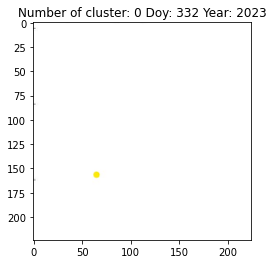

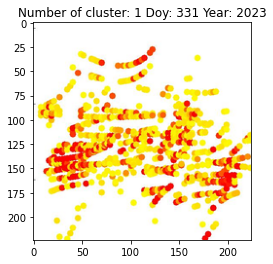

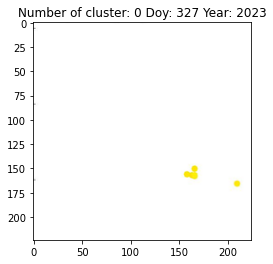

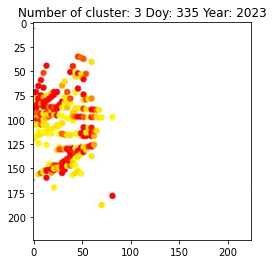

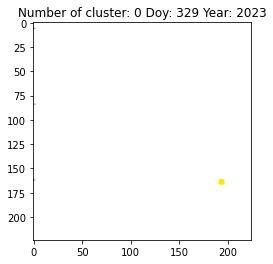

...

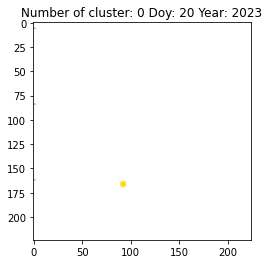

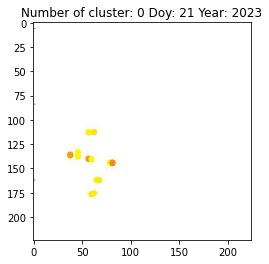

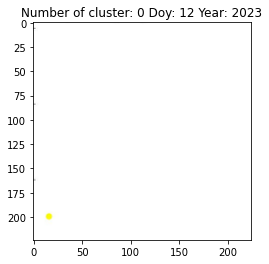

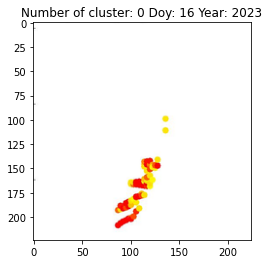

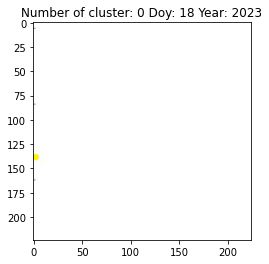

In [167]:
labels = y_pred_kmeans.copy()
counter_0 = 0
counter_1 = 0
counter_2 = 0
counter_3 = 0
counter_4 = 0

for i in range(425):

  if year_arr[i] == '2023':

    plt.imshow(dataset_old[i, :, :])
    str_title = 'Number of cluster: ' + str(labels[i]) + ' Doy: ' + str(data_date[i]) + ' Year: ' + str(year_arr[i])
    plt.title(str_title)
    plt.show()
    if labels[i] == 0:
      counter_0 += 1
    if labels[i] == 1:
      counter_1 += 1
    if labels[i] == 2:
      counter_2 += 1
    if labels[i] == 3:
      counter_3 += 1
    if y_pred_kmeans[i] == 4:
      counter_4 += 1


  #print('Number of graph keogram', i)

Download the results to plot the statistics

In [168]:
import pandas as pd

# Загрузка CSV файлов в датафреймы
merged_df_1 = pd.read_csv('Keograms/merged_df_1.csv')
merged_df = pd.read_csv('Keograms/merged_df.csv')

In [169]:
merged_df['labels'] = labels.copy()

In [170]:
merged_df_1['labels'] = labels.copy()

In [171]:
label_mapping = {
    2: 'no significant',
    0: 'moderate',
    1: 'significant',
    3: 'double bubble',
    4: 'extensive'
}

# Заменяем лейблы
merged_df['labels'] = merged_df['labels'].map(label_mapping)

In [172]:
merged_df_1['labels'] = merged_df_1['labels'].map(label_mapping)

In [173]:
reverse_mapping = {
    'no significant': 0,
    'moderate': 1,
    'significant': 2,
    'double bubble': 3,
    'extensive': 4
}

# Заменяем лейблы обратно
merged_df['labels'] = merged_df['labels'].map(reverse_mapping)

In [174]:
merged_df_1['labels'] = merged_df_1['labels'].map(reverse_mapping)

In [175]:
labels = y_pred_kmeans.copy()

In [176]:
merged_df_1.head(10)

,year_x,doy,labels,Kp_3,Kp_6,Kp_9,Kp_12,Kp_15,Kp_18,Kp_21,Kp_24,doy_new,year_y,max_Kp
0,2021,106,1,2.000,2.333,2.667,2.333,3.333,3.000,5.000,4.333,106,2021,2.667
1,2021,118,1,1.000,0.000,0.000,0.333,0.333,0.667,0.333,0.667,118,2021,1.000
2,2021,132,1,1.000,1.000,4.000,4.333,7.000,6.667,2.000,3.000,132,2021,4.333
3,2021,194,1,2.333,1.000,0.333,0.667,0.667,0.667,1.000,1.333,194,2021,2.333
4,2021,214,1,1.000,0.333,0.333,1.667,2.667,4.000,4.667,4.000,214,2021,1.667
5,2021,215,1,3.667,2.333,2.333,2.000,2.333,1.000,0.667,1.333,215,2021,3.667
6,2021,216,1,2.000,1.333,1.333,1.333,0.667,1.333,0.333,0.000,216,2021,2.000
7,2021,221,1,1.333,0.667,1.667,1.000,0.667,0.333,1.000,0.333,221,2021,1.667
8,2021,226,1,0.667,0.667,1.000,0.667,0.333,1.333,0.667,0.333,226,2021,1.000
9,2021,236,3,0.333,0.333,0.667,1.000,0.333,0.667,2.000,2.333,236,2021,1.000


In [177]:
data_date_1 = np.load('Keograms/data_date.npy')
year_arr_1 = np.load('Keograms/year_arr.npy')

In [178]:
#np.save('Keograms/labels.npy', labels)

In [179]:
labels = np.load('Keograms/labels.npy')

In [180]:
selected_rows_F10_type3 = merged_df.loc[merged_df['labels'] == 2]
F10_7_arr_type3 = selected_rows_F10_type3['F10.7'].to_numpy()
n_F10_type3 = len(F10_7_arr_type3)
iqr_F10_type3 = np.percentile(F10_7_arr_type3, 75) - np.percentile(F10_7_arr_type3, 25)
bin_width_F10 = 2 * iqr_F10_type3 / np.cbrt(n_F10_type3)
num_bins_F10 = int(np.ceil((F10_7_arr_type3.max() - F10_7_arr_type3.min()) / bin_width_F10))

In [181]:
selected_rows_Kp_type3 = merged_df_1.loc[merged_df_1['labels'] == 2]
Kp_arr_type3 = selected_rows_Kp_type3['Kp_9'].to_numpy()
n_Kp_type3 = len(Kp_arr_type3)
iqr_Kp_type3 = np.percentile(Kp_arr_type3, 75) - np.percentile(Kp_arr_type3, 25)
bin_width_Kp = 2 * iqr_Kp_type3 / np.cbrt(n_Kp_type3)
num_bins_Kp = int(np.ceil((Kp_arr_type3.max() - Kp_arr_type3.min()) / bin_width_Kp))

In [182]:
bin_width_F10 = 20  # Ширина столбцов для F10.7
bin_width_Kp = 0.667   # Ширина столбцов для Kp

min_F10_7 = 50
max_F10_7 = 270

min_Kp = 0
max_Kp = 7

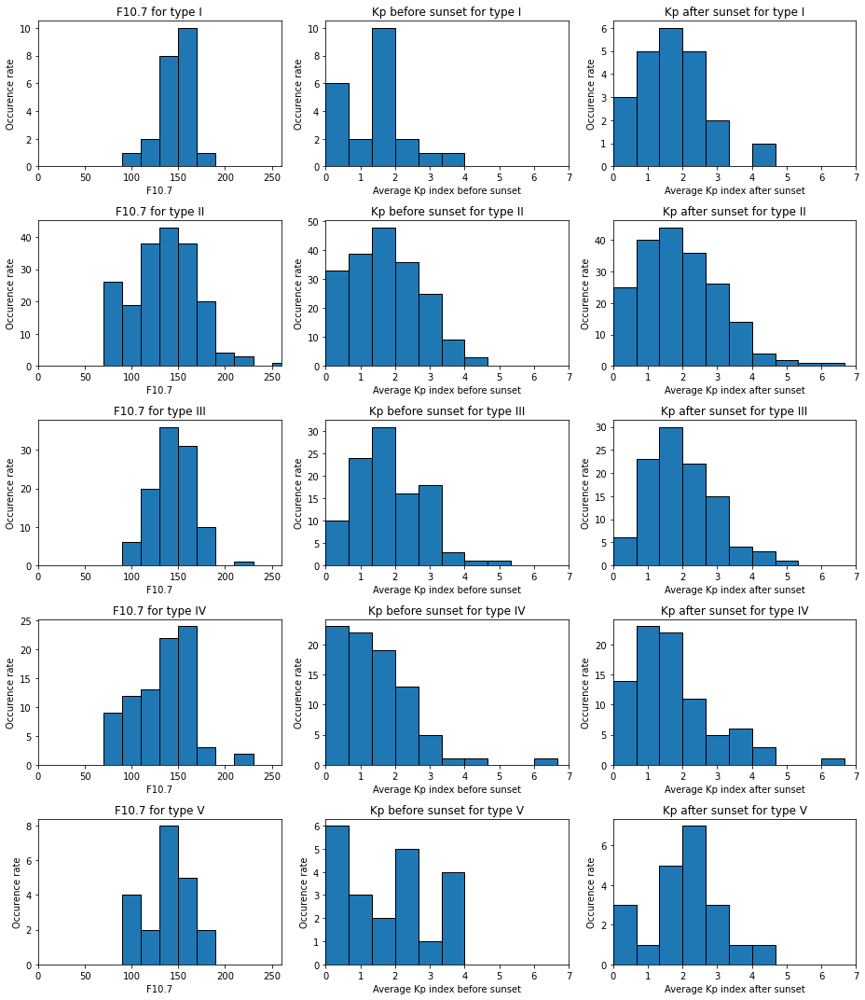

In [183]:
import numpy as np
import matplotlib.pyplot as plt

# Define a mapping for the Roman numerals
roman_numerals = ['I', 'II', 'III', 'IV', 'V']

fig, axs = plt.subplots(5, 3, figsize=(13, 15))

for i in range(5):
    # Обработка данных для F10.7
    selected_rows_F10 = merged_df.loc[merged_df['labels'] == i]
    F10_7_arr = selected_rows_F10['F10.7'].to_numpy()
    n_F10 = len(F10_7_arr)
    axs[i, 0].hist(F10_7_arr, bins=np.arange(min_F10_7, max_F10_7 + bin_width_F10, bin_width_F10), edgecolor='black')
    axs[i, 0].set_xlabel('F10.7')
    axs[i, 0].set_ylabel('Occurence rate')
    axs[i, 0].set_title(f'F10.7 for type {roman_numerals[i]}')
    axs[i, 0].set_xlim(0, 260)

    # Обработка данных для Kp (before sunset)
    selected_rows_Kp = merged_df_1.loc[merged_df_1['labels'] == i]
    Kp_arr_select = selected_rows_Kp[['Kp_3', 'Kp_6', 'Kp_9', 'Kp_12']].to_numpy()
    Kp_arr = np.mean(Kp_arr_select, axis=1)
    axs[i, 1].hist(Kp_arr, bins=np.arange(min_Kp, max_Kp + bin_width_Kp, bin_width_Kp), edgecolor='black')
    axs[i, 1].set_xlabel('Average Kp index before sunset')
    axs[i, 1].set_ylabel('Occurence rate')
    axs[i, 1].set_title(f'Kp before sunset for type {roman_numerals[i]}')
    axs[i, 1].set_xticks(range(10))
    axs[i, 1].set_xlim(0, 7)

    # Data processing for Kp (after sunset)
    Kp_arr_select = selected_rows_Kp[['Kp_15', 'Kp_18', 'Kp_21', 'Kp_24']].to_numpy()
    Kp_arr = np.mean(Kp_arr_select, axis=1)
    axs[i, 2].hist(Kp_arr, bins=np.arange(min_Kp, max_Kp + bin_width_Kp, bin_width_Kp), edgecolor='black')
    axs[i, 2].set_xlabel('Average Kp index after sunset')
    axs[i, 2].set_ylabel('Occurence rate')
    axs[i, 2].set_title(f'Kp after sunset for type {roman_numerals[i]}')
    axs[i, 2].set_xticks(range(10))
    axs[i, 2].set_xlim(0, 7)

plt.tight_layout()
plt.show()